In [1]:
import SimDAT2D as sim

Select calibrant:
1. AgBh
2. Al
3. alpha_Al2O3
4. Au
5. C14H30O
6. CeO2
7. Cr2O3
8. cristobaltite
9. CrOx
10. CuO
11. hydrocerussite
12. LaB6
13. LaB6_SRM660a
14. LaB6_SRM660b
15. LaB6_SRM660c
16. mock
17. NaCl
18. Ni
19. PBBA
20. Pt
21. quartz
22. Si
23. Si_SRM640
24. Si_SRM640a
25. Si_SRM640b
26. Si_SRM640c
27. Si_SRM640d
28. Si_SRM640e
29. TiO2
30. ZnO
LaB6_SRM660b


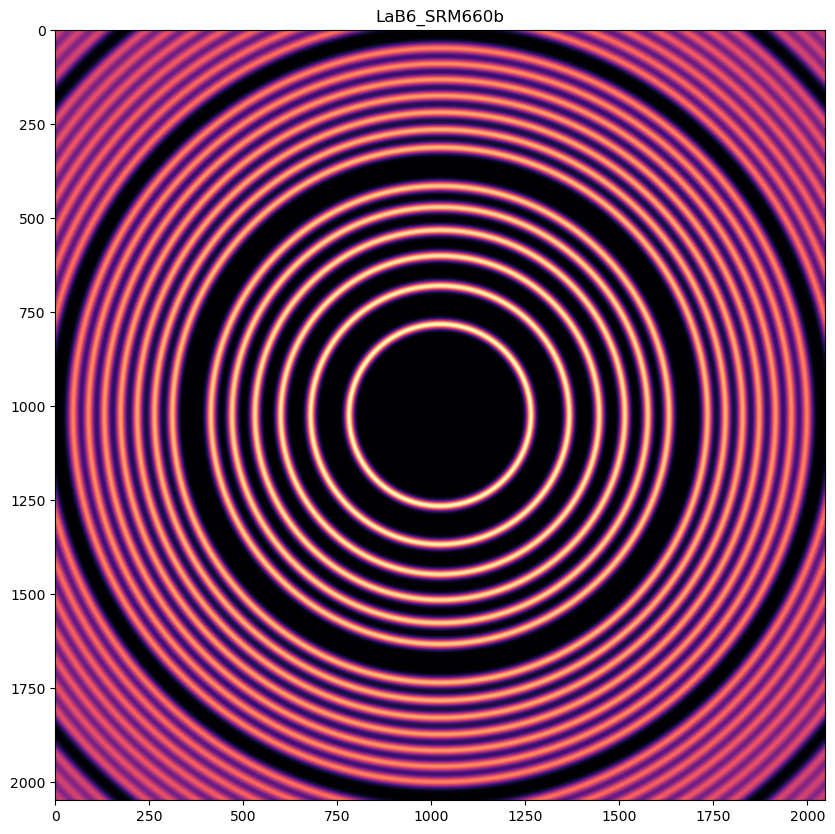

In [5]:
isotropic = sim.create_isotropic(.4, .5e-10, cmap = 'magma')

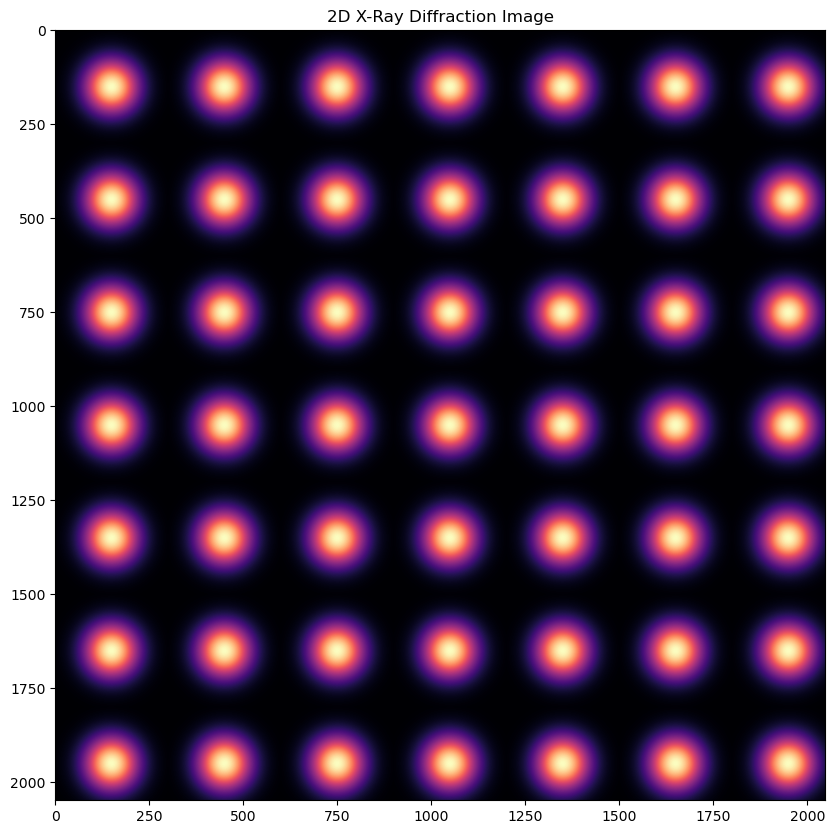

In [12]:
anisotropic = sim.create_anisotropic(25, 50, 300, 300, cmap = 'magma')

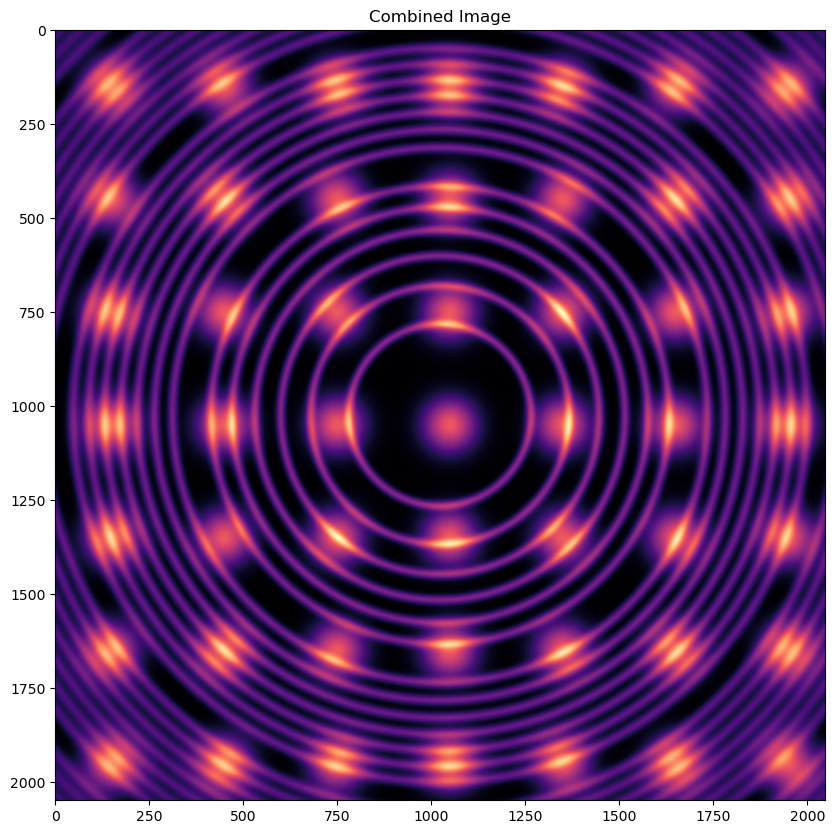

In [15]:
combined = sim.combine_image(isotropic, anisotropic*1.7, cmap = 'magma')

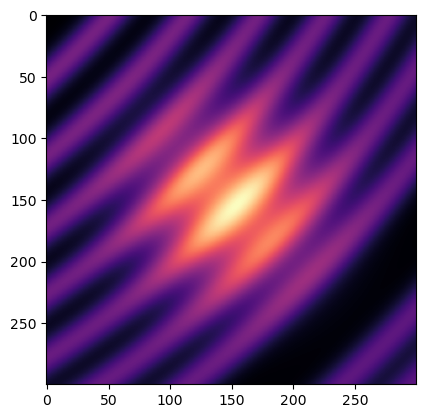

In [18]:
import matplotlib.pyplot as plt

# Define the region of interest
x_start = 1500
x_end = 1800
y_start = 1500
y_end = 1800

# Display the region of interest
plt.imshow(combined[y_start:y_end, x_start:x_end], cmap='magma')
plt.show()

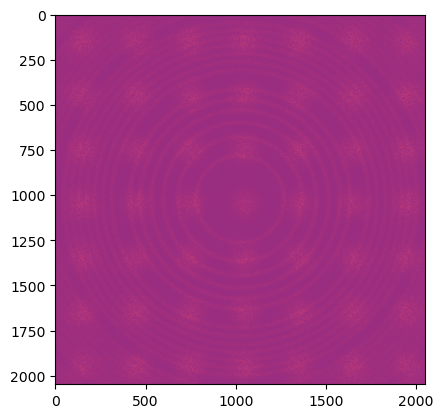

In [73]:
import numpy as np

# Generate a normalized noise map
noise_map = np.random.normal(loc=2, scale=5, size=(2048, 2048))

# Normalize the noise map
#normalized_noise_map = (noise_map - np.min(noise_map)) / (np.max(noise_map) - np.min(noise_map))

# Multiply the normalized noise map with your image
result = noise_map * combined

# Display the result
import matplotlib.pyplot as plt
plt.imshow(result, cmap='magma')
plt.show()

In [71]:
q, integrated = sim.integrate_image(result, .4, .5e-10)

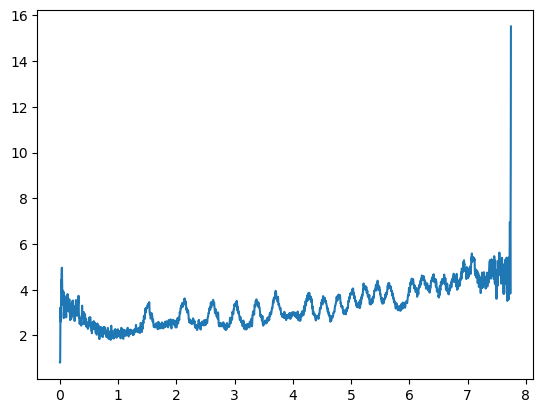

In [72]:
plt.plot(q, integrated)

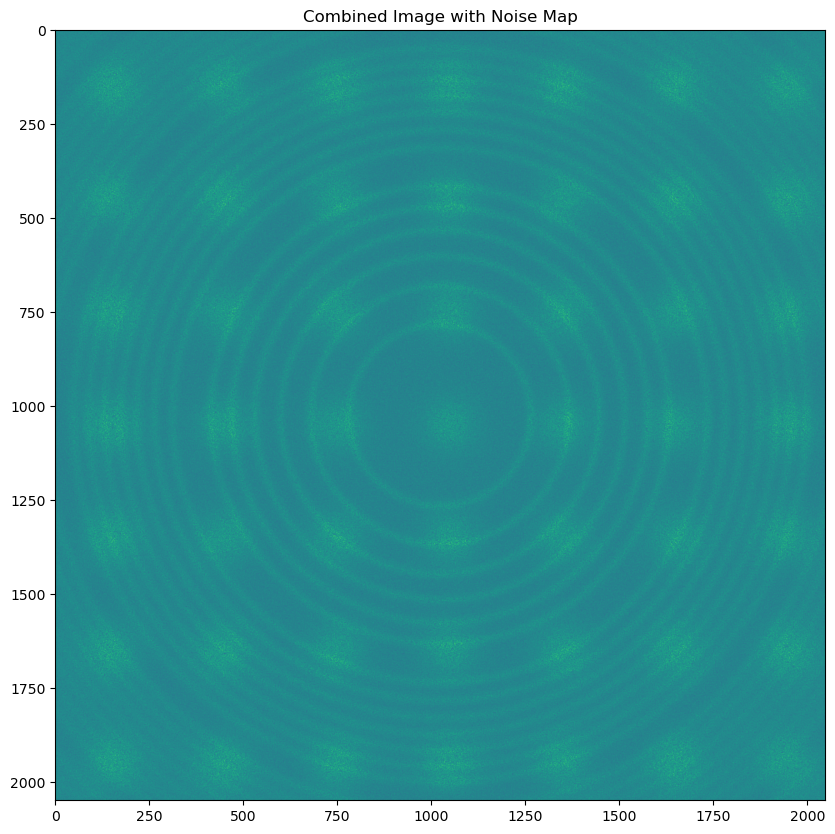

In [62]:
noisy = sim.generate_noisemap(result, 5)

In [63]:
q, integrated = sim.integrate_image(noisy, .4, .5e-10)

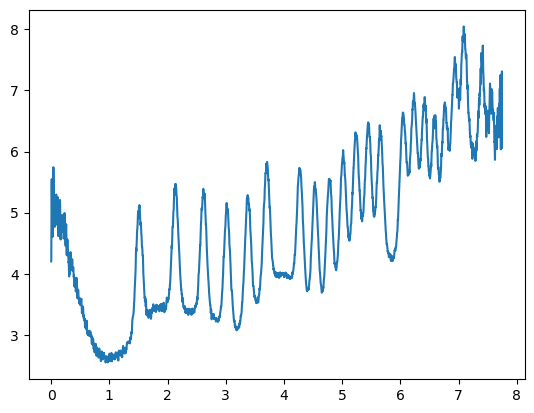

In [64]:
plt.plot(q, integrated)

In [68]:
q, integrated = sim.integrate_image(combined, .4, .5e-10)

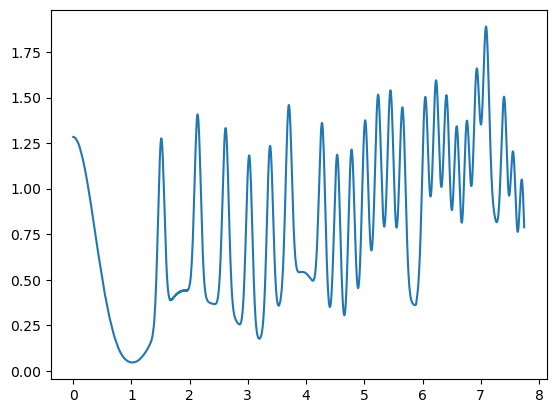

In [69]:
plt.plot(q, integrated)

In [86]:
def generate_noisemap(combined_image, intensity = 'med', cmap = 'viridis'):
    """
    This function generates a noise map to overlay on top of the combined image, the noise map should be the same size as the combined image and are random values between 0 and 1 scalars that are multiplied by the combined image.
    
    Parameters:
        combined_image (2D array): The image of the combined spots and calibration.
        intensity (float): The intensity of the noise map.
    """
    
    if intensity == 'low':
        intensity = 2
    elif intensity == 'med':
        intensity = 5
    elif intensity == 'high':
        intensity = 7.5

    #generate a noise map to overlay on top of the combined image, the noise map should be the same size as the combined image and are random values between 0 and 1 scalars that are multiplied by the combined image
    #the user can specify how much impact the noise map has on the combined image by specifying the intensity of the noise map
    # Generate a normalized noise map
    noise_map = np.random.normal(loc=2, scale=intensity, size=(2048, 2048))

    # Normalize the noise map
    #normalized_noise_map = (noise_map - np.min(noise_map)) / (np.max(noise_map) - np.min(noise_map))

    # Multiply the normalized noise map with your image
    result = noise_map * combined_image
    
    #display the combined image with the noise map
    plt.figure(figsize=(10, 10))
    plt.imshow(result, cmap=cmap)
    plt.title("Combined Image with Noise Map")
    plt.show()
    
    return result

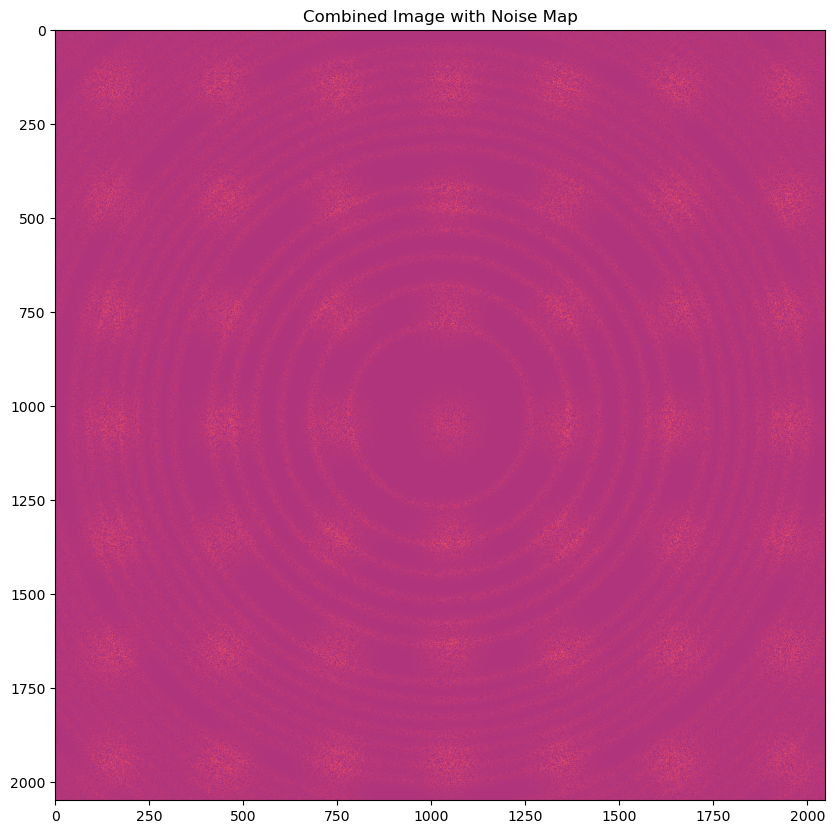

In [92]:
noisy_fig = generate_noisemap(combined, intensity = 'med', cmap = 'magma')

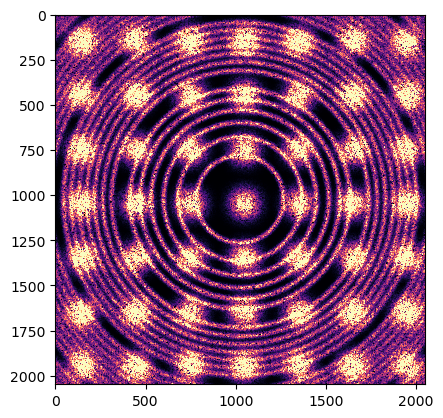

In [102]:
plt.imshow(noisy_fig, cmap='magma', vmin = 0, vmax = 3)

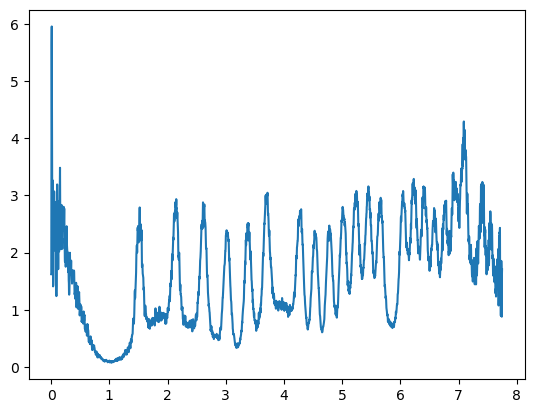

In [90]:
q, integrated = sim.integrate_image(noisy_fig, .4, .5e-10)
plt.plot(q, integrated)

Select calibrant:
1. AgBh
2. Al
3. alpha_Al2O3
4. Au
5. C14H30O
6. CeO2
7. Cr2O3
8. cristobaltite
9. CrOx
10. CuO
11. hydrocerussite
12. LaB6
13. LaB6_SRM660a
14. LaB6_SRM660b
15. LaB6_SRM660c
16. mock
17. NaCl
18. Ni
19. PBBA
20. Pt
21. quartz
22. Si
23. Si_SRM640
24. Si_SRM640a
25. Si_SRM640b
26. Si_SRM640c
27. Si_SRM640d
28. Si_SRM640e
29. TiO2
30. ZnO
CeO2


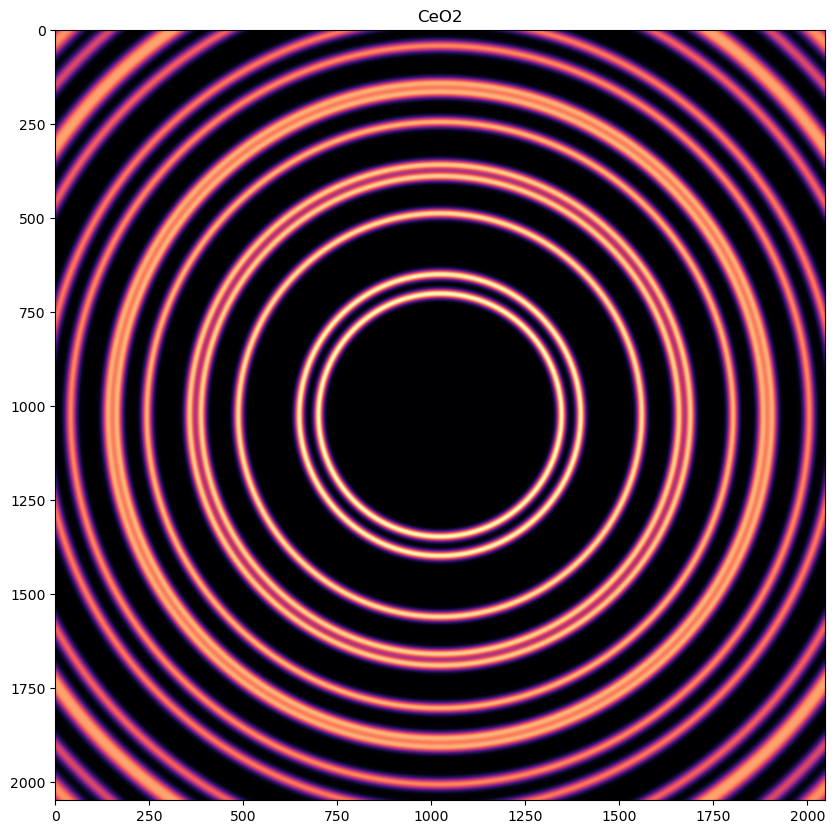

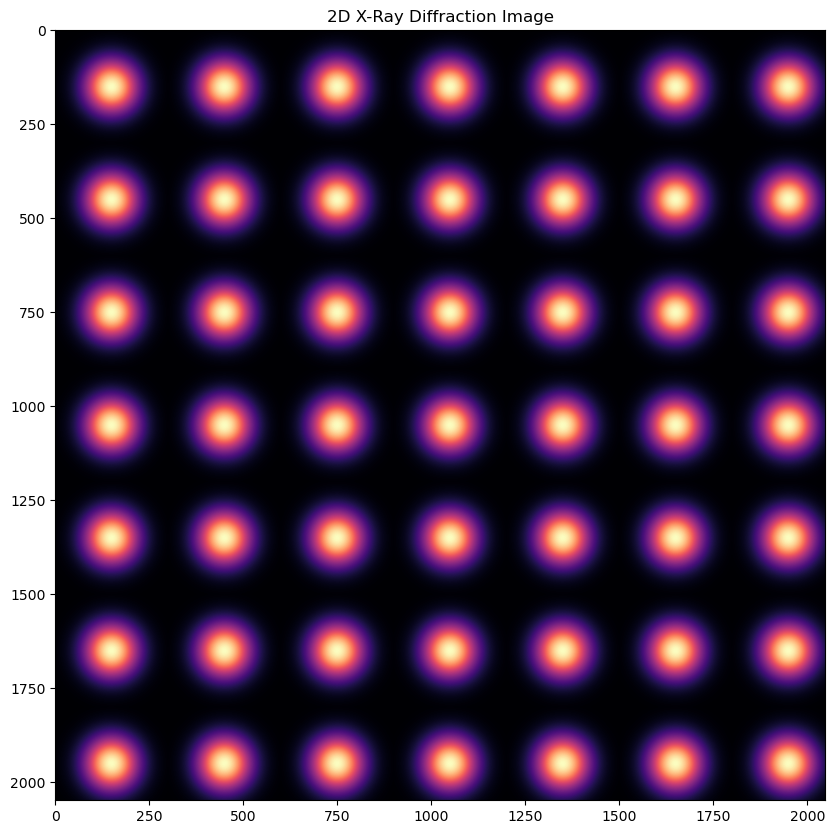

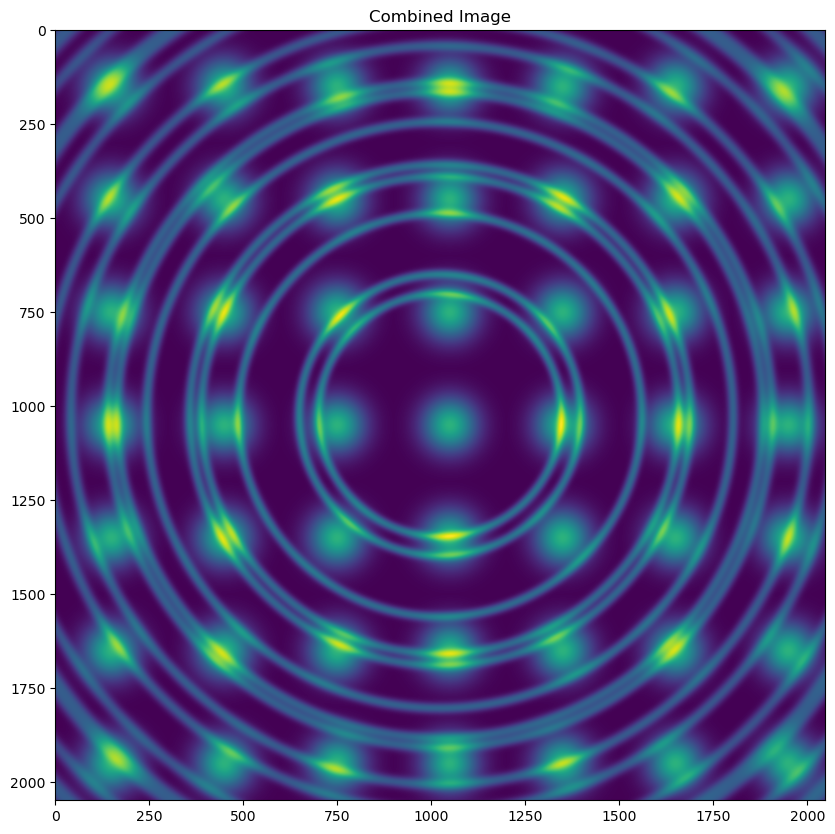

In [104]:
ceo2 = sim.combine_image(sim.create_isotropic(.4, .5e-10, cmap = 'magma'), sim.create_anisotropic(25, 50, 300, 300, cmap = 'magma')*1.7)

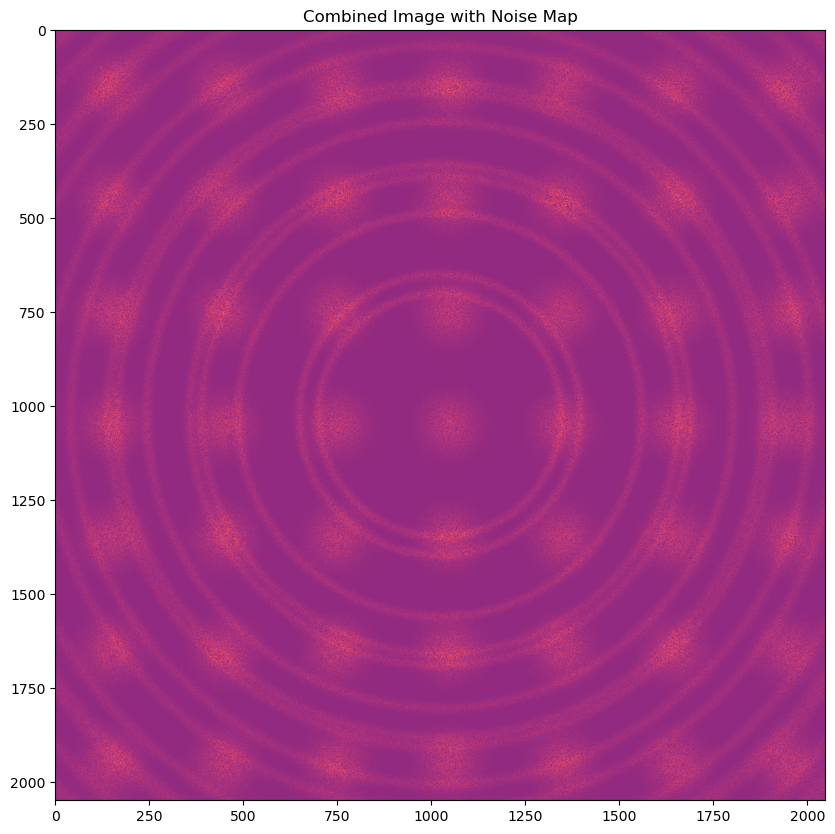

In [110]:
noisy_fig_1 = generate_noisemap(ceo2, intensity = 'low', cmap = 'magma')

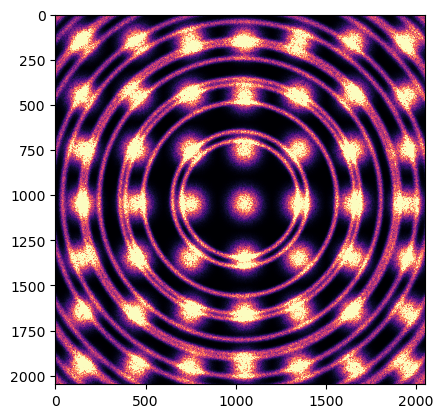

In [111]:
plt.imshow(noisy_fig_1, cmap='magma', vmin = 0, vmax = 3)

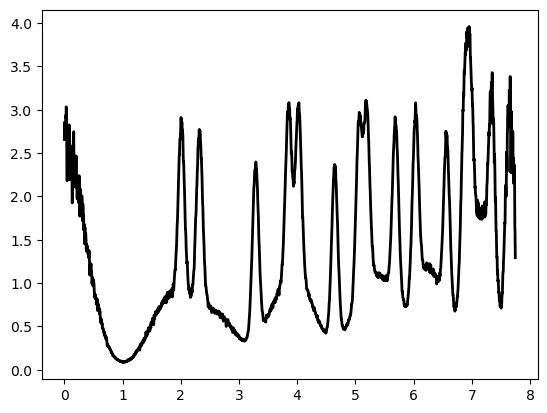

In [125]:
q, integrated_1 = sim.integrate_image(noisy_fig_1, .4, .5e-10)
plt.plot(q, integrated_1, c = 'k', lw= 2)

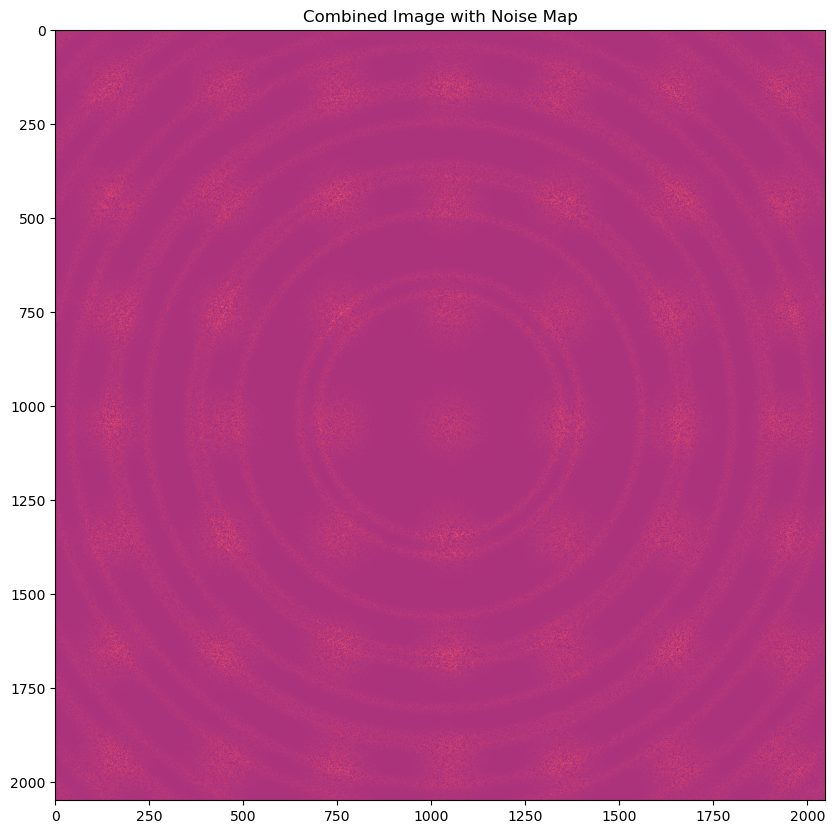

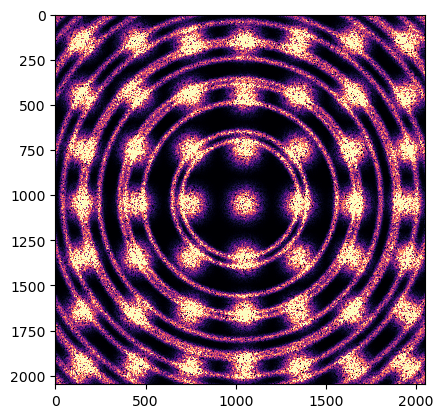

In [126]:
noisy_fig_2 = generate_noisemap(ceo2, intensity = 'med', cmap = 'magma')
plt.imshow(noisy_fig_2, cmap='magma', vmin = 0, vmax = 3)
q, integrated_2 = sim.integrate_image(noisy_fig_2, .4, .5e-10)

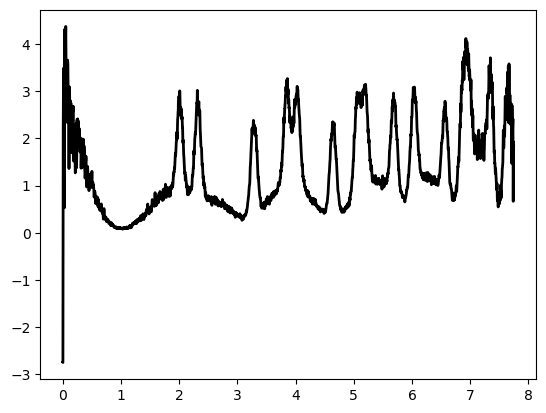

In [127]:
plt.plot(q, integrated_2, c = 'k', lw= 2)
plt.show()

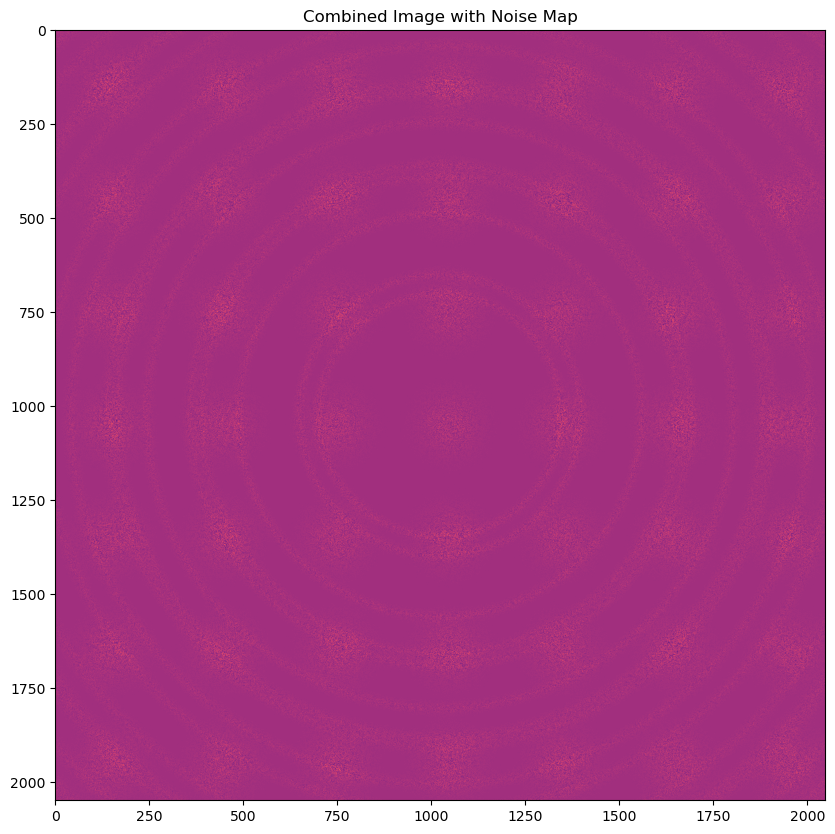

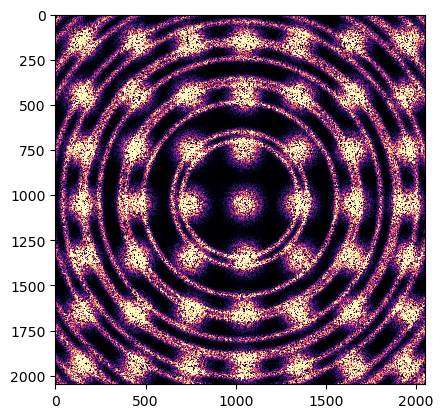

In [128]:
noisy_fig_3 = generate_noisemap(ceo2, intensity = 'high', cmap = 'magma')
plt.imshow(noisy_fig_3, cmap='magma', vmin = 0, vmax = 3)
q, integrated_3 = sim.integrate_image(noisy_fig_3, .4, .5e-10)

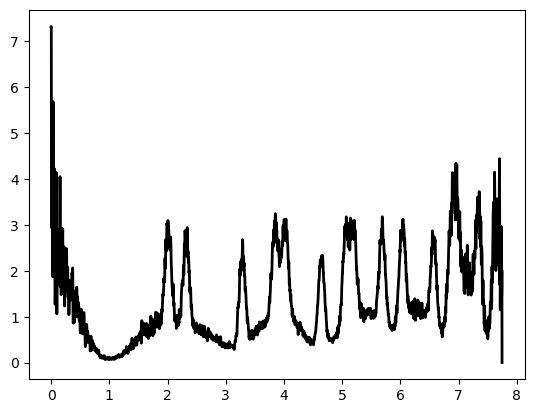

In [129]:
plt.plot(q, integrated_3, c = 'k', lw= 2)
plt.show()

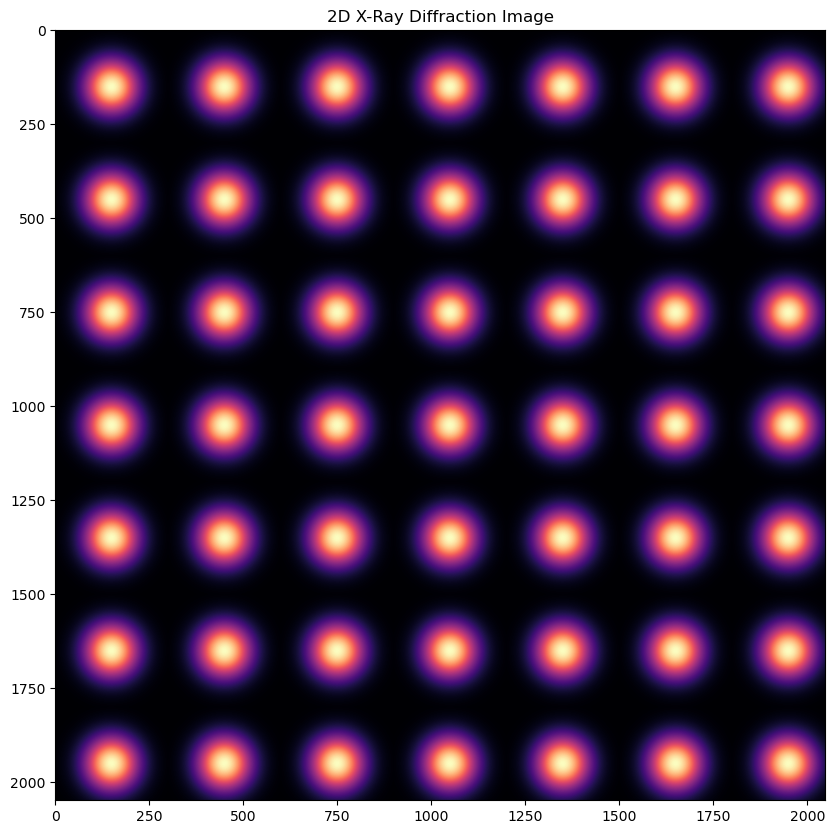

In [130]:
a = sim.create_anisotropic(25, 50, 300, 300, cmap = 'magma')

Select calibrant:
1. AgBh
2. Al
3. alpha_Al2O3
4. Au
5. C14H30O
6. CeO2
7. Cr2O3
8. cristobaltite
9. CrOx
10. CuO
11. hydrocerussite
12. LaB6
13. LaB6_SRM660a
14. LaB6_SRM660b
15. LaB6_SRM660c
16. mock
17. NaCl
18. Ni
19. PBBA
20. Pt
21. quartz
22. Si
23. Si_SRM640
24. Si_SRM640a
25. Si_SRM640b
26. Si_SRM640c
27. Si_SRM640d
28. Si_SRM640e
29. TiO2
30. ZnO
CeO2


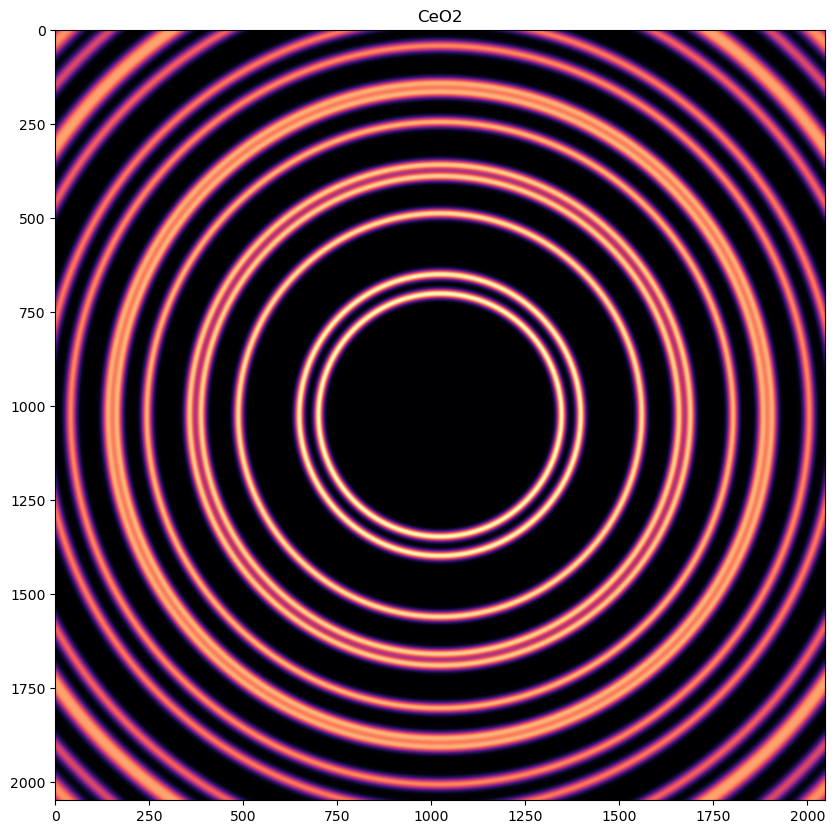

In [131]:
b = sim.create_isotropic(.4, .5e-10, cmap = 'magma')

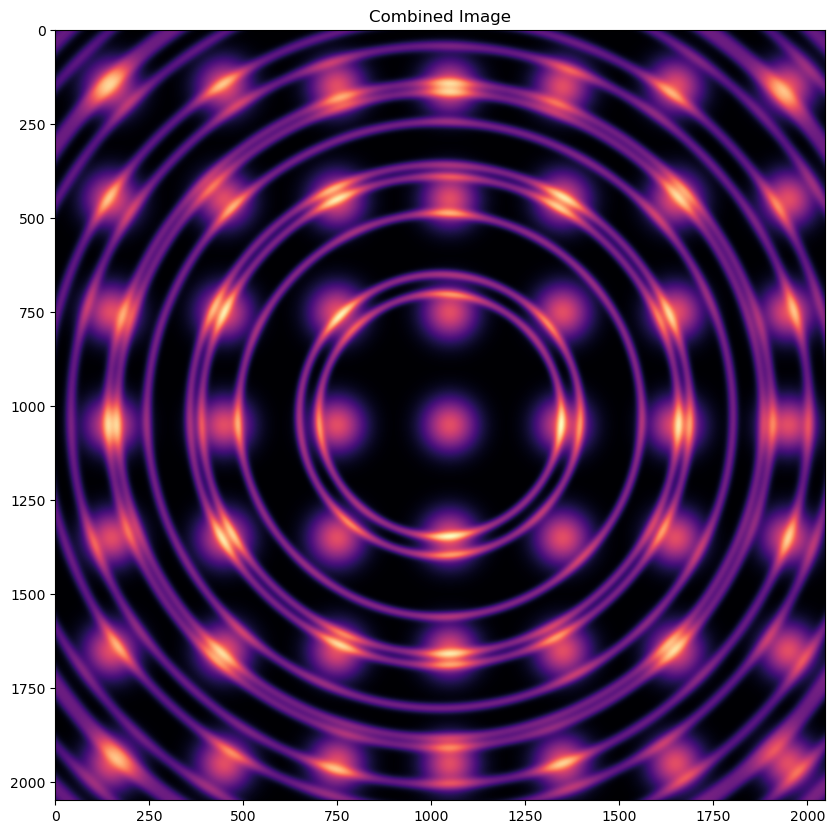

In [158]:
c = sim.combine_image(a*1.5, b, cmap = 'magma')

In [145]:
q, one = sim.integrate_image(a, .4, .5e-10)

In [146]:
q, two = sim.integrate_image(b, .4, .5e-10)

In [147]:
q, three = sim.integrate_image(c, .4, .5e-10)

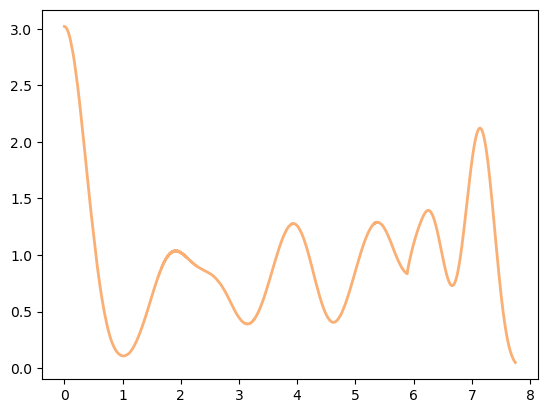

In [153]:
plt.plot(q, one*4, label = 'Anisotropic', lw = 2, c = '#faaf74')

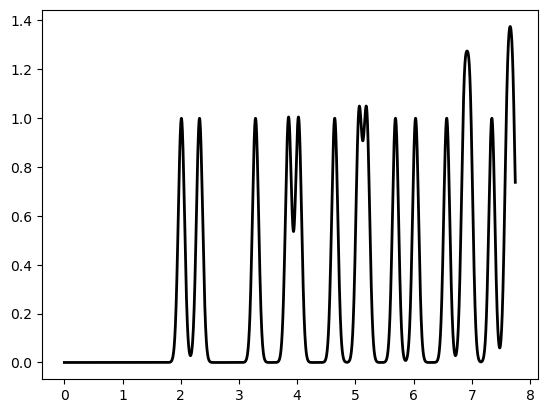

In [155]:
plt.plot(q, two, label = 'Isotropic', c = 'k', lw=2)

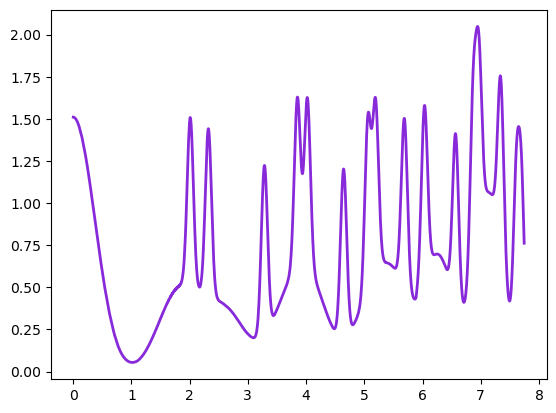

In [157]:
plt.plot(q, three, label = 'Combined', c = '#882ada', lw=2)